## Milo ageing analysis (dataset corrected) - HHCA mural compartment
#### 09/07/2026

In [1]:
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pertpy as pt

/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pertpy as pt

In [3]:
import matplotlib
matplotlib.rcParams.update({
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': False,
    'axes.spines.bottom': False,
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})

In [4]:
import sys, os, shutil

print(sys.executable)
print(os.environ.get("CONDA_DEFAULT_ENV"))
print(shutil.which("R"))
print(os.environ.get("R_HOME"))

/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/bin/python
None
None
None


In [5]:
import os
import sys

conda_prefix = os.path.dirname(os.path.dirname(sys.executable))
print(conda_prefix)

import glob
print(glob.glob(conda_prefix + "/bin/R"))
print(glob.glob(conda_prefix + "/lib/R"))

/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo
['/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/bin/R']
['/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/R']


In [6]:
sc.settings.set_figure_params(dpi=300,fontsize=12)

In [7]:
import os
import sys
import shutil
import subprocess

conda_prefix = os.path.dirname(os.path.dirname(sys.executable))
os.environ["PATH"] = f"{conda_prefix}/bin:" + os.environ.get("PATH", "")
os.environ["R_HOME"] = f"{conda_prefix}/lib/R"

print("python:", sys.executable)
print("R path:", shutil.which("R"))
print("R_HOME:", os.environ.get("R_HOME"))

# optional extra check
print(subprocess.check_output(["R", "--version"], text=True).split("\n")[0])

python: /rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/bin/python
R path: /rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/bin/R
R_HOME: /rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/R
R version 4.5.3 (2026-03-11) -- "Reassured Reassurer"


In [8]:
import rpy2.robjects as ro

print(ro.r("R.version.string"))
ro.r("library(edgeR)")
ro.r("library(limma)")
ro.r("library(statmod)")
print("R bridge works")

R callback write-console: Loading required package: limma
  


[1] "R version 4.5.3 (2026-03-11)"

R bridge works


In [9]:
adata_orig = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Human_Heart_Cell_Atlas_Integration/v1_objects_May26/core_mural_subembedding_updated.h5ad')

In [10]:
adata_orig

AnnData object with n_obs × n_vars = 135508 × 36601
    obs: 'sample_id', 'barcode', 'alignment_software', 'assay_ontology_term_id', 'author_batch_notes', 'cell_enrichment', 'cell_number_loaded', 'cell_viability_percentage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'gene_annotation_version', 'institute', 'intron_inclusion', 'is_primary_data', 'library_id', 'library_id_repository', 'library_preparation_batch', 'library_sequencing_run', 'manner_of_death', 'organism_ontology_term_id', 'protocol_url', 'reference_genome', 'sample_collection_method', 'sample_collection_site', 'sample_collection_year', 'sample_id_metadata', 'sample_preservation_method', 'sample_source', 'sampled_site_condition', 'self_reported_ethnicity_ontology_term_id', 'sequenced_fragment', 'sequencing_platform', 'sex_ontology_term_id', 'suspension_type', 'tissue_free_text', 'tissue_ontology_term_id', 'tissue_type', 'dataset', 'disease', 'n_genes', 'original_cell_type', 'sex', 'tissue',

In [11]:
adata = adata_orig.copy()

In [12]:
donor_counts = (
    adata.obs
    .groupby(["Final Level 4_harmonized", "age_10yr_bins"])["donor_id"]
    .nunique()
    .reset_index(name="n_donors")
)

donor_counts

/var/tmp/pbs.3364532.pbs-7/ipykernel_42596/3457371139.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["Final Level 4_harmonized", "age_10yr_bins"])["donor_id"]


,Final Level 4_harmonized,age_10yr_bins,n_donors
0,Pericytes,0-20,3
1,Pericytes,20-30,12
2,Pericytes,30-40,16
3,Pericytes,40-50,41
4,Pericytes,50-60,67
5,Pericytes,60-70,67
6,Pericytes,70-80,22
7,Pericytes,80-90,3
8,Pericytes AGT+,0-20,3
9,Pericytes AGT+,20-30,8


In [13]:
valid_groups = donor_counts[
    donor_counts["n_donors"] > 2
][["Final Level 4_harmonized", "age_10yr_bins"]]

In [14]:
valid_tuples = set(
    zip(
        valid_groups["Final Level 4_harmonized"],
        valid_groups["age_10yr_bins"]
    )
)

mask = adata.obs.apply(
    lambda x: (x["Final Level 4_harmonized"], x["age_10yr_bins"]) in valid_tuples,
    axis=1
)

adata_sub = adata[mask].copy()

In [15]:
adata_sub

AnnData object with n_obs × n_vars = 112530 × 36601
    obs: 'sample_id', 'barcode', 'alignment_software', 'assay_ontology_term_id', 'author_batch_notes', 'cell_enrichment', 'cell_number_loaded', 'cell_viability_percentage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'gene_annotation_version', 'institute', 'intron_inclusion', 'is_primary_data', 'library_id', 'library_id_repository', 'library_preparation_batch', 'library_sequencing_run', 'manner_of_death', 'organism_ontology_term_id', 'protocol_url', 'reference_genome', 'sample_collection_method', 'sample_collection_site', 'sample_collection_year', 'sample_id_metadata', 'sample_preservation_method', 'sample_source', 'sampled_site_condition', 'self_reported_ethnicity_ontology_term_id', 'sequenced_fragment', 'sequencing_platform', 'sex_ontology_term_id', 'suspension_type', 'tissue_free_text', 'tissue_ontology_term_id', 'tissue_type', 'dataset', 'disease', 'n_genes', 'original_cell_type', 'sex', 'tissue',

In [16]:
pd.crosstab(adata_sub.obs['development_stage_ontology_term_id'], adata_sub.obs['dataset'], dropna = False)

dataset,Hocker_2021,Kanemaru_2023,Koenig_2022,Linna-Kuosmanen_Carebank_2024,Linna-Kuosmanen_Periheart_2024,Litviňuková_2020,Reichart_2022,Selewa_2023,Sim_2021,Teichmann_Noseda,Tucker_Aortic_Stenosis_Hypertrophy,Tucker_GTEx
development_stage_ontology_term_id,,,,,,,,,,,,
HsapDv:0000129,0,0,0,0,0,0,0,0,302,0,0,0
HsapDv:0000135,0,0,0,0,0,0,0,0,512,0,0,0
HsapDv:0000136,0,0,0,0,0,0,0,0,69,0,0,0
HsapDv:0000141,0,0,0,0,0,0,0,3782,0,0,0,0
HsapDv:0000147,1437,0,0,0,0,0,0,0,0,0,0,0
HsapDv:0000148,0,0,0,0,0,0,0,2018,0,0,0,0
HsapDv:0000149,1533,0,0,0,0,0,0,1914,0,0,0,0
HsapDv:0000237,0,137,1632,0,0,0,1944,0,0,140,269,978
HsapDv:0000238,0,0,1426,0,0,0,0,0,0,0,1209,2612


In [17]:
pd.crosstab(adata_sub.obs['development_stage_ontology_term_id'], adata_sub.obs['age_10yr_bins'], dropna=False)

age_10yr_bins,0-20,20-30,30-40,40-50,50-60,60-70,70-80,80-90
development_stage_ontology_term_id,,,,,,,,
HsapDv:0000129,0,0,302,0,0,0,0,0
HsapDv:0000135,0,0,0,512,0,0,0,0
HsapDv:0000136,0,0,0,69,0,0,0,0
HsapDv:0000141,0,0,0,3782,0,0,0,0
HsapDv:0000147,0,0,0,0,1437,0,0,0
HsapDv:0000148,0,0,0,0,2018,0,0,0
HsapDv:0000149,0,0,0,0,3447,0,0,0
HsapDv:0000237,0,5100,0,0,0,0,0,0
HsapDv:0000238,0,0,5247,0,0,0,0,0


In [18]:
adata = adata_sub[adata_sub.obs["age_10yr_bins"].isin(["0-20","30-40","40-50","50-60","60-70","70-80","80-90"])]

In [19]:
adata.obs.age_10yr_bins.value_counts(dropna=False)

age_10yr_bins
50-60    39575
40-50    33772
60-70    20512
30-40     5549
70-80     5460
0-20      2470
80-90       92
Name: count, dtype: int64

In [20]:
adata.obs.dataset.value_counts()

dataset
Reichart_2022                         22356
Litviňuková_2020                      20403
Tucker_GTEx                           19594
Koenig_2022                           17727
Selewa_2023                            7714
Kanemaru_2023                          7515
Tucker_Aortic_Stenosis_Hypertrophy     4863
Hocker_2021                            2970
Teichmann_Noseda                       1208
Linna-Kuosmanen_Carebank_2024          1179
Linna-Kuosmanen_Periheart_2024         1018
Sim_2021                                883
Name: count, dtype: int64

In [21]:
adata = adata[~adata.obs['Final Level 4_harmonized'].isin(['Unassigned'])]

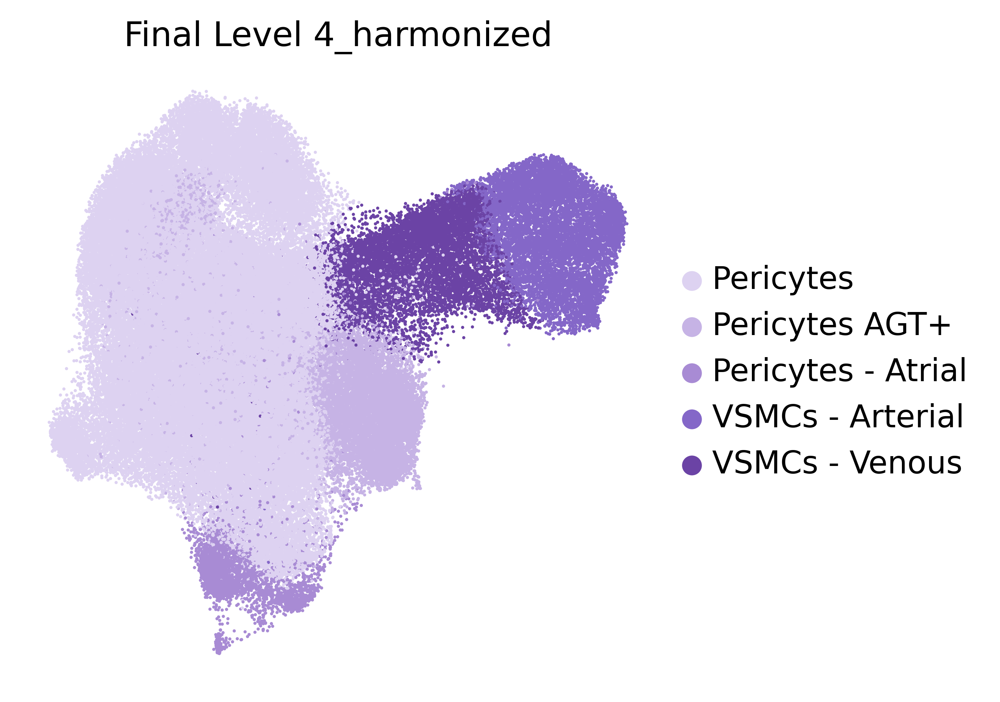

In [22]:
sc.pl.umap(adata, color=["Final Level 4_harmonized"], size = 5, frameon = False)

In [23]:
adata.obs.age_10yr_bins.value_counts()

age_10yr_bins
50-60    39403
40-50    33663
60-70    20367
30-40     5457
70-80     5441
0-20      2470
80-90       89
Name: count, dtype: int64

In [24]:
mapping = {
    "0-20": 10,
    "30-40": 35,
    "40-50": 45,
    "50-60": 55,
    "60-70": 65,
    "70-80": 75,
    "80-90": 85
}

adata.obs["age_continuous"] = adata.obs["age_10yr_bins"].map(mapping)

/var/tmp/pbs.3364532.pbs-7/ipykernel_42596/3007866182.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["age_continuous"] = adata.obs["age_10yr_bins"].map(mapping)


In [25]:
adata.obs.age_continuous.value_counts()

age_continuous
55    39403
45    33663
65    20367
35     5457
75     5441
10     2470
85       89
Name: count, dtype: int64

In [26]:
pd.crosstab(adata.obs['development_stage_ontology_term_id'], adata.obs['age_continuous'], dropna = False)

age_continuous,10,35,45,55,65,75,85
development_stage_ontology_term_id,,,,,,,
HsapDv:0000129,0,302,0,0,0,0,0
HsapDv:0000135,0,0,512,0,0,0,0
HsapDv:0000136,0,0,69,0,0,0,0
HsapDv:0000141,0,0,3761,0,0,0,0
HsapDv:0000147,0,0,0,1432,0,0,0
HsapDv:0000148,0,0,0,2010,0,0,0
HsapDv:0000149,0,0,0,3443,0,0,0
HsapDv:0000238,0,5155,0,0,0,0,0
HsapDv:0000239,0,0,29321,0,0,0,0


In [27]:
adata.obs.tissue_general.value_counts(dropna = False)

tissue_general
Left Ventricle     62767
Right Ventricle     9718
apex of heart       8113
Left Atrium         7463
IV Septum           6272
Right Atrium        4895
Septum              3398
SA Node             1811
AV Node             1248
NaN                 1205
Name: count, dtype: int64

In [28]:
def stacked_barplot(adata, xaxis, stack, xaxis_label, legend_label, shift_top=0.2, xaxis_rotation=45, figsize=(10,5), percent=True):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
   
    ax= pd.crosstab(adata.obs[xaxis],
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    #ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0, colors=colors)
    ax_1 = ax.plot.bar(figsize=figsize,stacked=True, rot=0)
    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0),
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label)
    plt.xlabel(xaxis_label,fontweight="bold")
    plt.ylabel('Percent Distribution',fontweight="bold")
   
    if percent:
        for rec in ax_1.patches:
            height = rec.get_height()
            ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
                   ha = 'center', va='center', fontsize=14.5, weight='bold') #
   
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')
   
    plt.xticks(rotation=xaxis_rotation, ha = 'right')
   
    ax_1.grid(False)
    plt.show()

/var/tmp/pbs.3364532.pbs-7/ipykernel_42596/1936666829.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')


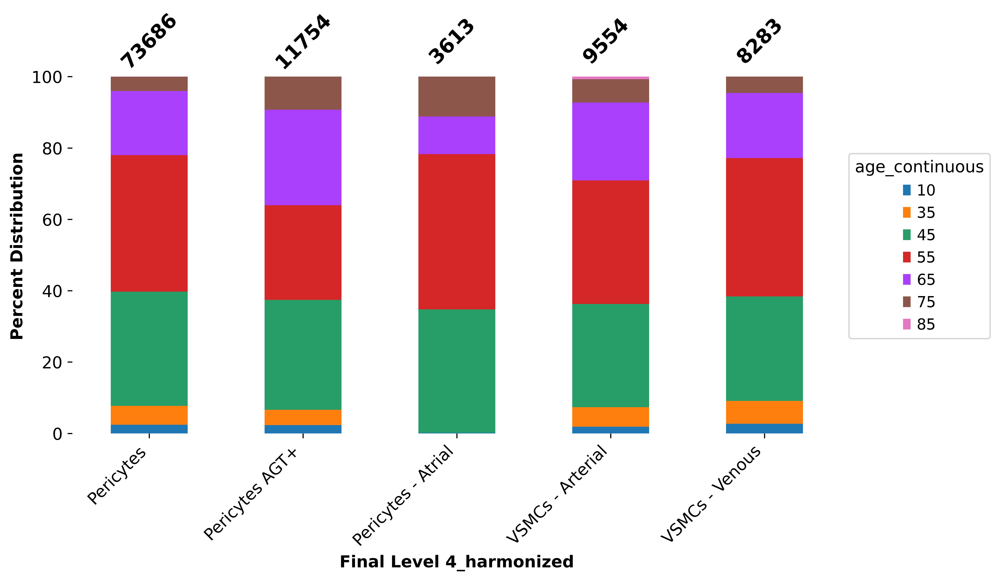

In [29]:
stacked_barplot(adata,xaxis="Final Level 4_harmonized",stack="age_continuous",xaxis_label="Final Level 4_harmonized",legend_label="age_continuous",percent=False)

/var/tmp/pbs.3364532.pbs-7/ipykernel_42596/1936666829.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')


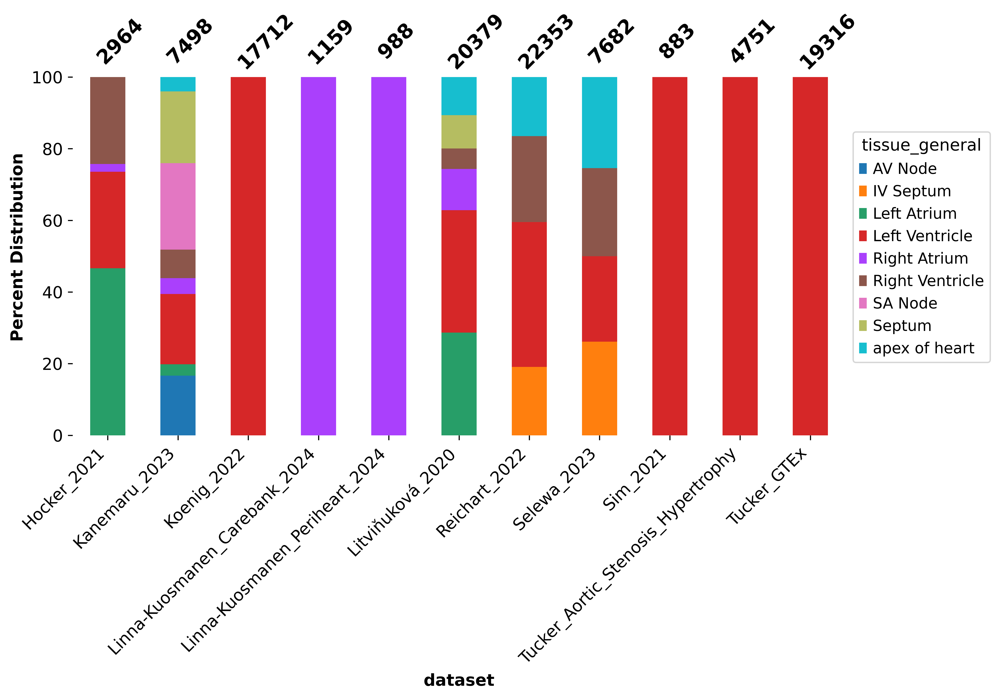

In [30]:
stacked_barplot(adata,xaxis="dataset",stack="tissue_general",xaxis_label="dataset",legend_label="tissue_general",percent=False)

In [31]:
stacked_barplot(adata,xaxis="Final Level 4_harmonized",stack="donor_id",xaxis_label="Final Level 4_harmonized",legend_label="donor_id",percent=False)

/var/tmp/pbs.3364532.pbs-7/ipykernel_42596/1936666829.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')


In [32]:
adata.obs['Final Level 4_harmonized'].value_counts()

Final Level 4_harmonized
Pericytes             73686
Pericytes AGT+        11754
VSMCs - Arterial       9554
VSMCs - Venous         8283
Pericytes - Atrial     3613
Name: count, dtype: int64

In [33]:
mapping = {
    'heart left ventricle': 'Left Ventricle',
    'ventricular musculature': 'Left Ventricle',
    'wall of left ventricle': 'Left Ventricle',
    'sinoatrial node': 'SA Node',
    'atrioventricular node' : 'AV Node',              
    'right atrium auricular region': 'Right Atrium',        
    'heart right ventricle': 'Right Ventricle',                 
    'LV APEX': 'Apex',                               
    'right cardiac atrium': 'Right Atrium',
    'apex of heart': 'Apex',
    'left cardiac atrium': 'Left Atrium',
    'interventricular septum': 'IV Septum',
    'SAN': 'SA Node',
    'cardiac septum': 'IV Septum',
    'apical region of left ventricle': 'Apex',
    'cardiac muscle of left atrium': 'Left Atrium',
    'left atrium auricular region': 'Left Atrium',
    'AVN': 'AV Node',
    'cardiac muscle of right ventricle': 'Right Ventricle',
    'cardiac muscle of left ventricle': 'Left Ventricle',
    'cardiac muscle of right atrium': 'Right Atrium'
}

adata.obs['tissue_final'] = adata.obs['tissue'].map(mapping).astype('category')

In [34]:
adata.obs['tissue_final'].value_counts()

tissue_final
Left Ventricle     61884
Apex               10127
Right Ventricle     9718
IV Septum           9670
Left Atrium         7463
Right Atrium        4895
SA Node             1885
AV Node             1248
Name: count, dtype: int64

# Milo

In [35]:
milo = pt.tl.Milo()
mdata = milo.load(adata)

In [36]:
adata.obs.donor_id.nunique()

240

# Build KNN graph
We can use scanpy functions to build a KNN graph. We set the dimensionality and value for k to use in subsequent steps.

Here the value of k indicates the smallest possible size of neighbourhood in which we will quantify differential abundance (i.e. with k=50 the smallest neighbourhood will have 50 cells). Depending on the number of samples, you might want to use a high value of k for neighbourhood analysis, to have sufficient power to estimate abundance fold-changes. Since here we have data from > 100 patients, we set k=150 to have on average more than one cell per donor in each neighbourhood.



In [37]:
sc.pp.neighbors(mdata["rna"], use_rep="X_emb", n_neighbors=250)

# Construct neighbourhoods
This step assigns cells to a set of representative neighbourhoods on the KNN graph.

In [38]:
milo.make_nhoods(mdata["rna"], prop=0.1)

In [39]:
mdata["rna"].obsm["nhoods"]

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 4200421 stored elements and shape (106890, 5540)>

In [40]:
mdata["rna"][mdata["rna"].obs["nhood_ixs_refined"] != 0].obs[["nhood_ixs_refined", "nhood_kth_distance"]]

,nhood_ixs_refined,nhood_kth_distance
ERS5009240-TCCCAGTCACGCGCAT,1,2.227237
ERS5009240-CATGCCTAGATCACTC,1,2.030463
ERS5009240-GAATAGACAGCGAACA,1,1.746887
ERS5009240-CGATGCGCAGACACCC,1,2.007101
ERS5009240-CTTAGGATCGCTGTCT,1,2.206290
...,...,...
HCAHeartST13294678-GCTTAACAGCGCTAAT,1,1.964975
HCAHeartST13294678-AAGTTTGTCACGAATC,1,1.864540
HCAHeartST13294678-TGACTCCTCTGGTCCT,1,1.624192
HCAHeartST13294678-GGTGTCCAGCATTTCT,1,1.941544


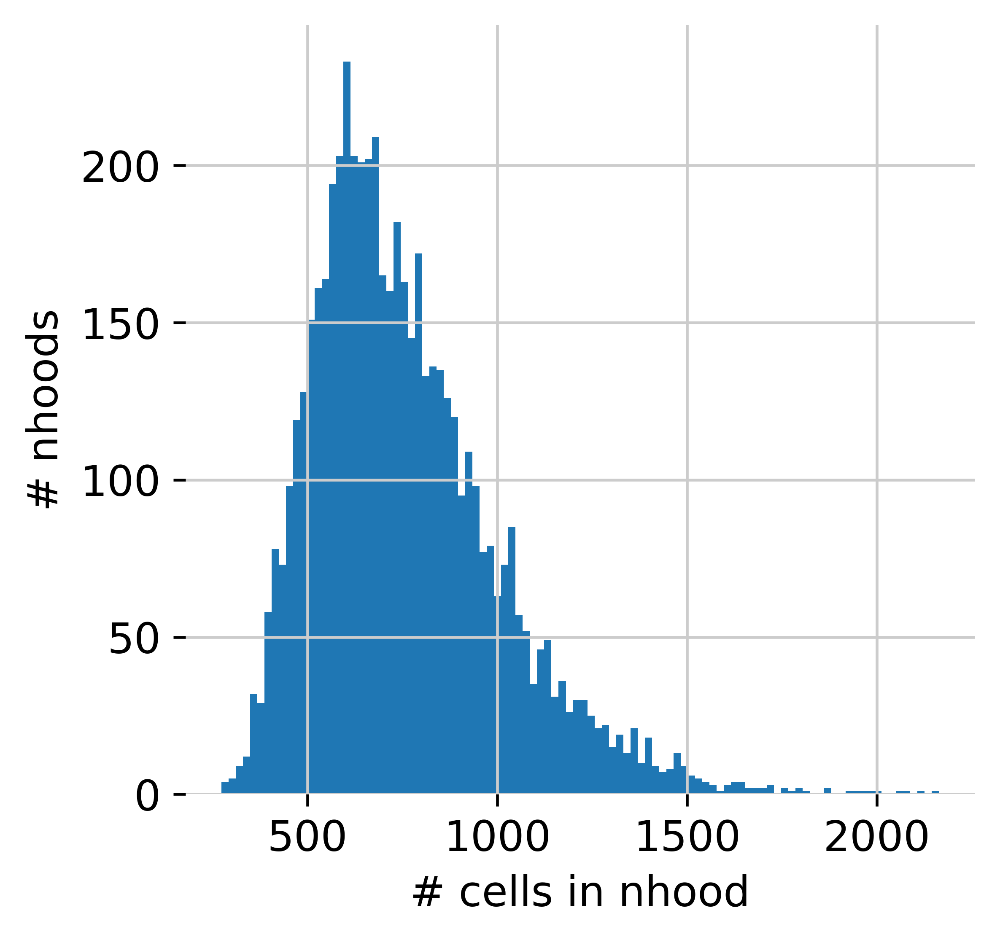

In [41]:
nhood_size = np.array(mdata["rna"].obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100)
plt.xlabel("# cells in nhood")
plt.ylabel("# nhoods");

# Count cells in neighbourhoods
Milo leverages the variation in cell numbers between replicates for the same experimental condition to test for differential abundance. Therefore we have to count how many cells from each sample (in this case the patient) are in each neighbourhood. We need to use the cell metadata saved in adata.obs and specify which column contains the sample information.


In [42]:
adata.obs["sample_id"]

ERS5009240-CTGGTCTGTCCTACAA                    ERS5009240
ERS5009240-GTTTACTCACCTGCAG                    ERS5009240
ERS5009240-GTTACCCAGTCAACAA                    ERS5009240
ERS5009240-TTCCAATCATCCTCAC                    ERS5009240
ERS5009240-GTGGCGTAGAGAGCGG                    ERS5009240
                                              ...        
HCAHeartST13294678-CGGGCTTAGTTCCTCA    HCAHeartST13294678
HCAHeartST13294678-CTTAATGAGGCTTAGT    HCAHeartST13294678
HCAHeartST13294678-GAGCGGTCACCTACGG    HCAHeartST13294678
HCAHeartST13294678-GTACACCCAATACTGT    HCAHeartST13294678
HCAHeartST13294678-CTTTCTTGTGGATTGC    HCAHeartST13294678
Name: sample_id, Length: 106890, dtype: category
Categories (367, object): ['11_001', '11_002', '12_003', '12_008', ..., 'PH-R16', 'PH-T38', 'PH-X61', 'PH-Y87']

In [43]:
mdata = milo.count_nhoods(mdata, sample_col="sample_id")

# Differential abundance testing with GLM
We are now ready to test for differential abundance in time. The experimental design needs to be specified with R-style formulas.


In [44]:
mdata

MuData object with n_obs × n_vars = 106890 × 36601
  2 modalities
    rna:	106890 x 36601
      obs:	'sample_id', 'barcode', 'alignment_software', 'assay_ontology_term_id', 'author_batch_notes', 'cell_enrichment', 'cell_number_loaded', 'cell_viability_percentage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'gene_annotation_version', 'institute', 'intron_inclusion', 'is_primary_data', 'library_id', 'library_id_repository', 'library_preparation_batch', 'library_sequencing_run', 'manner_of_death', 'organism_ontology_term_id', 'protocol_url', 'reference_genome', 'sample_collection_method', 'sample_collection_site', 'sample_collection_year', 'sample_id_metadata', 'sample_preservation_method', 'sample_source', 'sampled_site_condition', 'self_reported_ethnicity_ontology_term_id', 'sequenced_fragment', 'sequencing_platform', 'sex_ontology_term_id', 'suspension_type', 'tissue_free_text', 'tissue_ontology_term_id', 'tissue_type', 'dataset', 'disease', 'n_genes', 'original_cell_type', 'sex', 'tissue', 'cell_state', 'cell_type', 'cell_type_ontology_term_id', 'n_counts', 'percent_mito', 'scrublet_score', 'cell_typist_prediction', 'cell_typist_majority', 'tissue_general', 'assay', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'leiden_level_1', 'jamboree_leiden_level_2', 'jamboree_leiden_level_3', 'study_pi', 'development_stage', 'leiden_level_2', 'age', 'age_10yr_bins', 'age_20yr_bins', 'leiden_res_0.2', 'leiden_res_0.4', 'leiden_res_0.6', 'leiden_res_0.8', 'leiden_res_1.0', 'leiden_res_1.2', 'leiden_res_1.4', 'leiden_res_1.6', 'leiden_res_1.8', 'leiden_res_2.0', 'new_annotation_cell_type', 'new_annotation', 'Final Level 4_harmonized', 'Final Level 3_harmonized', 'Final Level 2_harmonized', 'Final Level 1_harmonized', 'age_continuous', 'tissue_final', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance'
      var:	'feature_types', 'gene_ids', 'genome', 'hb', 'highly_variable', 'highly_variable-batch_key=donor_id-n_top_genes=2000', 'integration_features', 'mito', 'n_cells', 'n_counts', 'ribo'
      uns:	'Final Level 4_harmonized_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_leiden_res_1.0', 'dendrogram_new_annotation', 'integration', 'leiden_level_2', 'leiden_level_3_colors', 'leiden_res_0.2', 'leiden_res_0.2_colors', 'leiden_res_0.4', 'leiden_res_0.4_colors', 'leiden_res_0.6', 'leiden_res_0.6_colors', 'leiden_res_0.8', 'leiden_res_0.8_colors', 'leiden_res_1.0', 'leiden_res_1.0_colors', 'leiden_res_1.2', 'leiden_res_1.2_colors', 'leiden_res_1.4', 'leiden_res_1.4_colors', 'leiden_res_1.6', 'leiden_res_1.6_colors', 'leiden_res_1.8', 'leiden_res_1.8_colors', 'leiden_res_2.0', 'leiden_res_2.0_colors', 'log1p', 'neighbors', 'new_annotation_cell_type_colors', 'new_annotation_colors', 'output_type', 'pca', 'preprocessing', 'rank_genes_groups', 'umap', 'wildcards', 'nhood_neighbors_key'
      obsm:	'X_emb', 'X_pca', 'X_umap', 'nhoods'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    milo:	367 x 5540
      var:	'index_cell', 'kth_distance'
      uns:	'sample_col'

In [45]:
mdata["rna"].obs["age_continuous"] = pd.to_numeric(
    mdata["rna"].obs["age_continuous"],
    errors="coerce"
)

In [46]:
print(mdata["rna"].obs["age_continuous"].dtype)

int64


In [47]:
milo.da_nhoods(mdata, design="~dataset + tissue_final + age_continuous", solver="edger")

In [48]:
mdata["milo"].var

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,adjust.method,comparison,test,SpatialFDR
0,ERS5009240-TCCCAGTCACGCGCAT,2.227237,-0.013056,9.372602,1.563151,0.211483,0.488460,BH,age_continuous,glm,0.491673
1,ERS5009240-CATGCCTAGATCACTC,2.030463,-0.030494,9.500703,7.915015,0.004992,0.064978,BH,age_continuous,glm,0.066162
2,ERS5009240-GAATAGACAGCGAACA,1.746887,-0.019335,9.742988,3.805166,0.051402,0.242768,BH,age_continuous,glm,0.246812
3,ERS5009240-CGATGCGCAGACACCC,2.007101,-0.031794,9.397414,10.767909,0.001069,0.023142,BH,age_continuous,glm,0.023226
4,ERS5009240-CTTAGGATCGCTGTCT,2.206290,-0.037222,9.258069,11.257153,0.000825,0.018803,BH,age_continuous,glm,0.018788
...,...,...,...,...,...,...,...,...,...,...,...
5535,HCAHeartST13294678-GCTTAACAGCGCTAAT,1.964975,-0.023819,9.344844,5.094157,0.024245,0.157096,BH,age_continuous,glm,0.160506
5536,HCAHeartST13294678-AAGTTTGTCACGAATC,1.864540,0.026066,9.650242,6.031919,0.014245,0.119890,BH,age_continuous,glm,0.122420
5537,HCAHeartST13294678-TGACTCCTCTGGTCCT,1.624192,-0.007216,9.723113,0.644404,0.422331,0.679360,BH,age_continuous,glm,0.679475
5538,HCAHeartST13294678-GGTGTCCAGCATTTCT,1.941544,-0.013725,9.316166,1.887211,0.169843,0.440511,BH,age_continuous,glm,0.444031


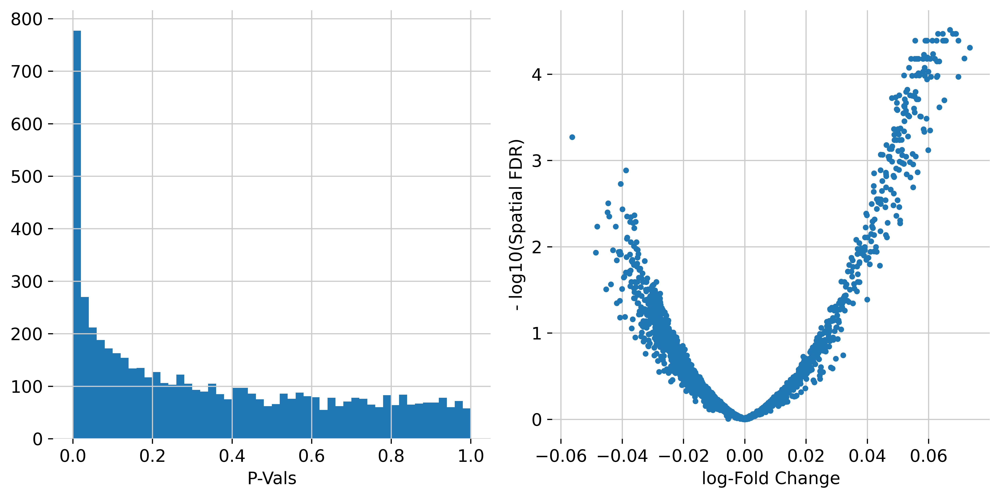

In [49]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10, 5]
plt.subplot(1, 2, 1)
plt.hist(mdata["milo"].var.PValue, bins=50)
plt.xlabel("P-Vals")
plt.subplot(1, 2, 2)
plt.plot(mdata["milo"].var.logFC, -np.log10(mdata["milo"].var.SpatialFDR), ".")
plt.xlabel("log-Fold Change")
plt.ylabel("- log10(Spatial FDR)")
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

# Visualize results on embedding
To visualize DA results relating them to the embedding of single cells, we can build an abstracted graph of neighbourhoods that we can superimpose on the single-cell embedding. Here each node represents a neighbourhood, and the layout of nodes is determined by the position of the index cell in the UMAP embedding of all single-cells. The neighbourhoods displaying singificant DA are colored by their log-Fold Change.

In [50]:
mdata

MuData object with n_obs × n_vars = 106890 × 36601
  2 modalities
    rna:	106890 x 36601
      obs:	'sample_id', 'barcode', 'alignment_software', 'assay_ontology_term_id', 'author_batch_notes', 'cell_enrichment', 'cell_number_loaded', 'cell_viability_percentage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'gene_annotation_version', 'institute', 'intron_inclusion', 'is_primary_data', 'library_id', 'library_id_repository', 'library_preparation_batch', 'library_sequencing_run', 'manner_of_death', 'organism_ontology_term_id', 'protocol_url', 'reference_genome', 'sample_collection_method', 'sample_collection_site', 'sample_collection_year', 'sample_id_metadata', 'sample_preservation_method', 'sample_source', 'sampled_site_condition', 'self_reported_ethnicity_ontology_term_id', 'sequenced_fragment', 'sequencing_platform', 'sex_ontology_term_id', 'suspension_type', 'tissue_free_text', 'tissue_ontology_term_id', 'tissue_type', 'dataset', 'disease', 'n_genes', 'original_cell_type', 'sex', 'tissue', 'cell_state', 'cell_type', 'cell_type_ontology_term_id', 'n_counts', 'percent_mito', 'scrublet_score', 'cell_typist_prediction', 'cell_typist_majority', 'tissue_general', 'assay', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'leiden_level_1', 'jamboree_leiden_level_2', 'jamboree_leiden_level_3', 'study_pi', 'development_stage', 'leiden_level_2', 'age', 'age_10yr_bins', 'age_20yr_bins', 'leiden_res_0.2', 'leiden_res_0.4', 'leiden_res_0.6', 'leiden_res_0.8', 'leiden_res_1.0', 'leiden_res_1.2', 'leiden_res_1.4', 'leiden_res_1.6', 'leiden_res_1.8', 'leiden_res_2.0', 'new_annotation_cell_type', 'new_annotation', 'Final Level 4_harmonized', 'Final Level 3_harmonized', 'Final Level 2_harmonized', 'Final Level 1_harmonized', 'age_continuous', 'tissue_final', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance'
      var:	'feature_types', 'gene_ids', 'genome', 'hb', 'highly_variable', 'highly_variable-batch_key=donor_id-n_top_genes=2000', 'integration_features', 'mito', 'n_cells', 'n_counts', 'ribo'
      uns:	'Final Level 4_harmonized_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_leiden_res_1.0', 'dendrogram_new_annotation', 'integration', 'leiden_level_2', 'leiden_level_3_colors', 'leiden_res_0.2', 'leiden_res_0.2_colors', 'leiden_res_0.4', 'leiden_res_0.4_colors', 'leiden_res_0.6', 'leiden_res_0.6_colors', 'leiden_res_0.8', 'leiden_res_0.8_colors', 'leiden_res_1.0', 'leiden_res_1.0_colors', 'leiden_res_1.2', 'leiden_res_1.2_colors', 'leiden_res_1.4', 'leiden_res_1.4_colors', 'leiden_res_1.6', 'leiden_res_1.6_colors', 'leiden_res_1.8', 'leiden_res_1.8_colors', 'leiden_res_2.0', 'leiden_res_2.0_colors', 'log1p', 'neighbors', 'new_annotation_cell_type_colors', 'new_annotation_colors', 'output_type', 'pca', 'preprocessing', 'rank_genes_groups', 'umap', 'wildcards', 'nhood_neighbors_key'
      obsm:	'X_emb', 'X_pca', 'X_umap', 'nhoods'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    milo:	367 x 5540
      obs:	'tissue_final', 'age_continuous', 'dataset', 'sample_id'
      var:	'index_cell', 'kth_distance', 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'adjust.method', 'comparison', 'test', 'SpatialFDR'
      uns:	'sample_col'

In [51]:
milo.build_nhood_graph(mdata, basis="X_umap")

/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


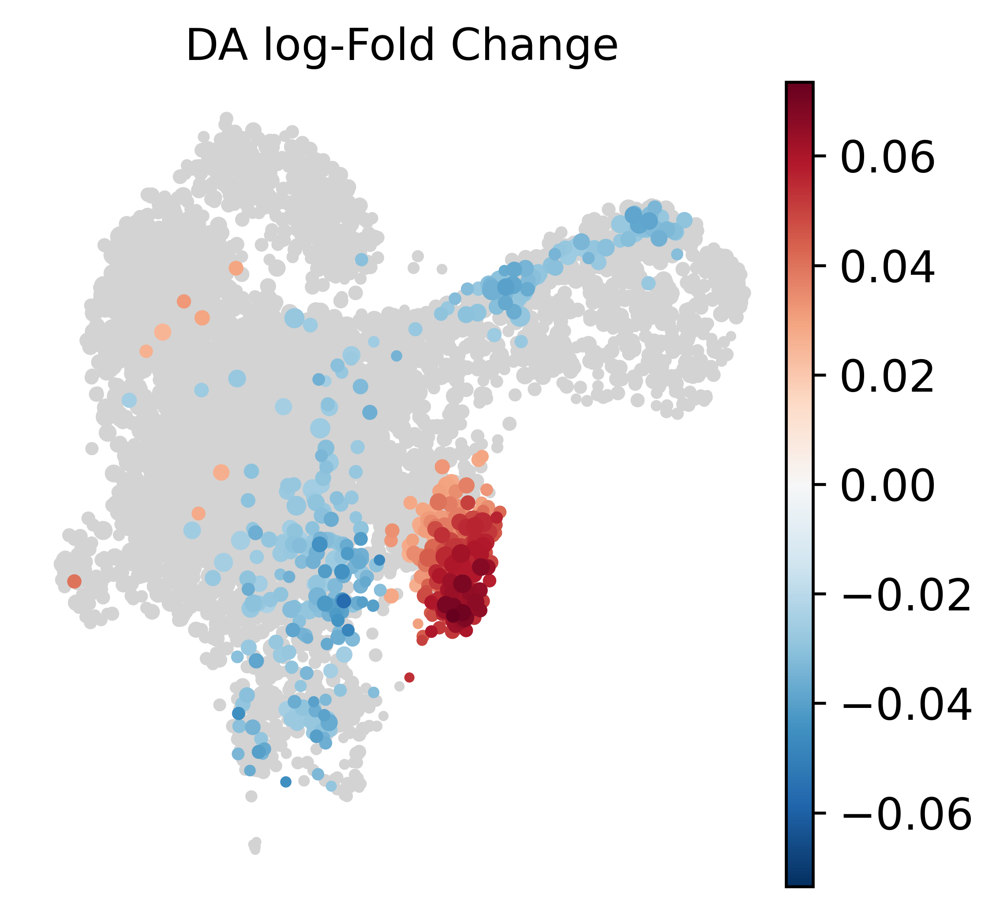

In [52]:
milo.plot_nhood_graph(
    mdata,
    alpha=0.1,  # SpatialFDR level (1%)
    min_size=0.1,  # Size of smallest dot
    #save="_VFB_milo_age_inVAE.pdf"
    #save = 'milo_mural_differential_abundance_umap.pdf'

)

In [61]:
milo.plot_nhood_graph(
    mdata,
    alpha=0.1,  # SpatialFDR level (1%)
    min_size=0.1,  # Size of smallest dot
    #save="_VFB_milo_age_inVAE.pdf"
    save = 'milo_mural_differential_abundance_umap.pdf'

)

/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/rds/general/user/snb20/home/miniforge3/envs/pertpy_milo/lib/python3.11/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


# Visualize result by celltype
We might want to visualize whether DA is particularly evident in certain cell types. To do this, we assign a cell type label to each neighbourhood by finding the most abundant cell type within cells in each neighbourhood (after all, neighbourhoods are in most cases small subpopulations within the same cell type). We can label neighbourhoods in the results data.frame using the function milo.annotate_nhoods. This also saves the fraction of cells harbouring the label.

In [53]:
milo.annotate_nhoods(mdata, anno_col="Final Level 4_harmonized")

In [54]:
#milo.plot_da_beeswarm(mdata, alpha=0.1)

In [55]:
mdata

MuData object with n_obs × n_vars = 106890 × 36601
  2 modalities
    rna:	106890 x 36601
      obs:	'sample_id', 'barcode', 'alignment_software', 'assay_ontology_term_id', 'author_batch_notes', 'cell_enrichment', 'cell_number_loaded', 'cell_viability_percentage', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'donor_id', 'gene_annotation_version', 'institute', 'intron_inclusion', 'is_primary_data', 'library_id', 'library_id_repository', 'library_preparation_batch', 'library_sequencing_run', 'manner_of_death', 'organism_ontology_term_id', 'protocol_url', 'reference_genome', 'sample_collection_method', 'sample_collection_site', 'sample_collection_year', 'sample_id_metadata', 'sample_preservation_method', 'sample_source', 'sampled_site_condition', 'self_reported_ethnicity_ontology_term_id', 'sequenced_fragment', 'sequencing_platform', 'sex_ontology_term_id', 'suspension_type', 'tissue_free_text', 'tissue_ontology_term_id', 'tissue_type', 'dataset', 'disease', 'n_genes', 'original_cell_type', 'sex', 'tissue', 'cell_state', 'cell_type', 'cell_type_ontology_term_id', 'n_counts', 'percent_mito', 'scrublet_score', 'cell_typist_prediction', 'cell_typist_majority', 'tissue_general', 'assay', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'leiden_level_1', 'jamboree_leiden_level_2', 'jamboree_leiden_level_3', 'study_pi', 'development_stage', 'leiden_level_2', 'age', 'age_10yr_bins', 'age_20yr_bins', 'leiden_res_0.2', 'leiden_res_0.4', 'leiden_res_0.6', 'leiden_res_0.8', 'leiden_res_1.0', 'leiden_res_1.2', 'leiden_res_1.4', 'leiden_res_1.6', 'leiden_res_1.8', 'leiden_res_2.0', 'new_annotation_cell_type', 'new_annotation', 'Final Level 4_harmonized', 'Final Level 3_harmonized', 'Final Level 2_harmonized', 'Final Level 1_harmonized', 'age_continuous', 'tissue_final', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance'
      var:	'feature_types', 'gene_ids', 'genome', 'hb', 'highly_variable', 'highly_variable-batch_key=donor_id-n_top_genes=2000', 'integration_features', 'mito', 'n_cells', 'n_counts', 'ribo'
      uns:	'Final Level 4_harmonized_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_leiden_res_1.0', 'dendrogram_new_annotation', 'integration', 'leiden_level_2', 'leiden_level_3_colors', 'leiden_res_0.2', 'leiden_res_0.2_colors', 'leiden_res_0.4', 'leiden_res_0.4_colors', 'leiden_res_0.6', 'leiden_res_0.6_colors', 'leiden_res_0.8', 'leiden_res_0.8_colors', 'leiden_res_1.0', 'leiden_res_1.0_colors', 'leiden_res_1.2', 'leiden_res_1.2_colors', 'leiden_res_1.4', 'leiden_res_1.4_colors', 'leiden_res_1.6', 'leiden_res_1.6_colors', 'leiden_res_1.8', 'leiden_res_1.8_colors', 'leiden_res_2.0', 'leiden_res_2.0_colors', 'log1p', 'neighbors', 'new_annotation_cell_type_colors', 'new_annotation_colors', 'output_type', 'pca', 'preprocessing', 'rank_genes_groups', 'umap', 'wildcards', 'nhood_neighbors_key'
      obsm:	'X_emb', 'X_pca', 'X_umap', 'nhoods'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    milo:	367 x 5540
      obs:	'dataset', 'tissue_final', 'age_continuous', 'sample_id'
      var:	'index_cell', 'kth_distance', 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'adjust.method', 'comparison', 'test', 'SpatialFDR', 'Nhood_size', 'nhood_annotation', 'nhood_annotation_frac'
      uns:	'sample_col', 'nhood', 'annotation_labels', 'annotation_obs'
      varm:	'X_milo_graph', 'frac_annotation'
      varp:	'nhood_connectivities'

In [56]:
import pandas as pd
import numpy as np
from plotnine import (
    ggplot, aes, geom_jitter, geom_hline, scale_fill_gradient2,
    scale_size_continuous, coord_flip, labs, theme_bw, theme,
    element_line, element_blank, element_text
)


def milo_plot_beeswarm(
    var_df: pd.DataFrame,
    annotation_col: str = "nhood_annotation",
    logfc_col: str = "logFC",
    fdr_col: str = "SpatialFDR",
    sig_threshold: float = 0.1,
    only_sig_classes: bool = False,
    classes_to_plot: list = None,
    title: str = "Milo DA",
    logfc_label: str = "log-Fold Change",
    fill_legend: str = "logFC",
    size_legend: str = "-log10(FDR)",
    cap_quantile: float = 0.99,
    jitter_width: float = 0.25,
    nonsig_size: float = 1.0,
    sig_size_range: tuple = (1.5, 5),
    figure_size: tuple = (7, 8),
    low_color: str = "#9ECAE1",
    mid_color: str = "lightgrey",
    high_color: str = "#08519C",
):
    """
    Create a Milo beeswarm-like jitter plot from mdata["milo"].var.

    Parameters
    ----------
    var_df
        DataFrame, typically mdata["milo"].var.
    annotation_col
        Column containing neighbourhood / cell type annotations.
    logfc_col
        Column containing log fold-change values.
    fdr_col
        Column containing adjusted p-values / FDR values.
    sig_threshold
        Threshold below which points are considered significant.
    only_sig_classes
        If True, only plot annotation classes that contain at least one
        significant neighbourhood (FDR < sig_threshold).
    classes_to_plot
        Optional list of annotation classes to include. Only these classes
        will be shown. Applied after `only_sig_classes` filtering.
    title
        Plot title.
    logfc_label
        Label for the log fold-change axis.
    fill_legend
        Legend title for fill scale.
    size_legend
        Legend title for size scale.
    cap_quantile
        Quantile used to cap logFC for color scaling.
    jitter_width
        Horizontal jitter width.
    nonsig_size
        Point size for non-significant points.
    sig_size_range
        Size range for significant points.
    figure_size
        Tuple passed to plotnine theme(figure_size=...).
    low_color, mid_color, high_color
        Colors for the diverging fill scale.

    Returns
    -------
    plotnine.ggplot
        A plotnine plot object.
    """
    required_cols = {annotation_col, logfc_col, fdr_col}
    missing = required_cols - set(var_df.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = var_df[[annotation_col, logfc_col, fdr_col]].copy()

    # Drop rows missing essential values
    df = df.dropna(subset=[annotation_col, logfc_col, fdr_col]).copy()
    if df.empty:
        raise ValueError("No valid rows remaining after dropping missing values.")

    # Numerical safety for FDR
    df[fdr_col] = pd.to_numeric(df[fdr_col], errors="coerce")
    df[logfc_col] = pd.to_numeric(df[logfc_col], errors="coerce")
    df = df.dropna(subset=[logfc_col, fdr_col]).copy()
    if df.empty:
        raise ValueError("No valid numeric rows remaining for logFC/FDR.")

    # Derived columns
    df["neg_log10_fdr"] = -np.log10(df[fdr_col].clip(lower=1e-300))
    df["is_sig"] = df[fdr_col] < sig_threshold

    # ── Filter: only classes with ≥1 significant nhood ──────────────
    if only_sig_classes:
        sig_classes = (
            df.loc[df["is_sig"], annotation_col]
            .unique()
            .tolist()
        )
        df = df[df[annotation_col].isin(sig_classes)].copy()
        if df.empty:
            raise ValueError(
                "No annotation classes have a significant neighbourhood "
                f"at FDR < {sig_threshold}."
            )

    # ── Filter: user-provided class list ────────────────────────────
    if classes_to_plot is not None:
        df = df[df[annotation_col].isin(classes_to_plot)].copy()
        if df.empty:
            raise ValueError(
                "None of the requested classes_to_plot are present in the data."
            )

    # Order annotations by median logFC
    ct_order = (
        df.groupby(annotation_col)[logfc_col]
        .median()
        .sort_values()
        .index.tolist()
    )
    df[annotation_col] = pd.Categorical(
        df[annotation_col],
        categories=ct_order,
        ordered=True,
    )

    # Cap logFC for colour scale
    abs_logfc = np.abs(df[logfc_col].dropna())
    if len(abs_logfc) == 0:
        raise ValueError("No non-missing logFC values found.")

    cap = np.quantile(abs_logfc, cap_quantile)
    if not np.isfinite(cap) or cap == 0:
        cap = abs_logfc.max()
    if not np.isfinite(cap) or cap == 0:
        cap = 1.0

    df["logFC_capped"] = df[logfc_col].clip(-cap, cap)

    # ── Build plot ──────────────────────────────────────────────────
    nonsig_df = df[~df["is_sig"]]
    sig_df = df[df["is_sig"]]

    p = (
        ggplot(df, aes(x=annotation_col, y=logfc_col))
        + geom_jitter(
            data=nonsig_df,
            fill="lightgrey",
            color="lightgrey",
            size=nonsig_size,
            stroke=0,
            width=jitter_width,
            height=0,
            alpha=0.7,
        )
        + geom_jitter(
            data=sig_df,
            mapping=aes(fill="logFC_capped", size="neg_log10_fdr"),
            stroke=0.3,
            color="black",
            width=jitter_width,
            height=0,
            alpha=0.9,
            shape="o",
        )
        + geom_hline(yintercept=0, linetype="dashed", color="grey", size=0.5)
        + scale_fill_gradient2(
            low=low_color,
            mid=mid_color,
            high=high_color,
            midpoint=0,
            limits=(-cap, cap),
            name=fill_legend,
        )
        + scale_size_continuous(
            range=sig_size_range,
            name=size_legend,
        )
        + coord_flip()
        + labs(x="", y=logfc_label, title=title)
        + theme_bw()
        + theme(
            figure_size=figure_size,
            panel_grid_major_x=element_line(color="#eeeeee"),
            panel_grid_major_y=element_blank(),
            panel_grid_minor=element_blank(),
            axis_text_y=element_text(size=12),
            legend_position="right",
        )
    )

    return p

In [ ]:
# Usage example
p = milo_plot_beeswarm(
    var_df=mdata["milo"].var,
    title="Milo DA ~ age (dataset + region corrected)",
    fill_legend="logFC",
    size_legend="-log10(SpatialFDR)",
    sig_threshold=0.1,
    figure_size= (6.5,3.5)
)
p

In [58]:
import pandas as pd
import numpy as np
from plotnine import (
    ggplot, aes, geom_jitter, geom_hline, scale_fill_gradient2,
    scale_size_continuous, coord_flip, labs, theme_bw, theme,
    element_line, element_blank, element_text
)


def milo_plot_beeswarm(
    var_df: pd.DataFrame,
    annotation_col: str = "nhood_annotation",
    logfc_col: str = "logFC",
    fdr_col: str = "SpatialFDR",
    sig_threshold: float = 0.1,
    only_sig_classes: bool = False,
    classes_to_plot: list = None,
    title: str = "Milo DA",
    logfc_label: str = "log-Fold Change",
    fill_legend: str = "logFC",
    size_legend: str = "-log10(FDR)",
    cap_quantile: float = 0.99,
    jitter_width: float = 0.25,
    nonsig_size: float = 1.0,
    sig_size_range: tuple = (1.5, 5),
    figure_size: tuple = (7, 8),
    low_color: str = "#2166AC",
    mid_color: str = "lightgrey",
    high_color: str = "#B2182B",
):
    """
    Create a Milo beeswarm-like jitter plot from mdata["milo"].var.

    Parameters
    ----------
    var_df
        DataFrame, typically mdata["milo"].var.
    annotation_col
        Column containing neighbourhood / cell type annotations.
    logfc_col
        Column containing log fold-change values.
    fdr_col
        Column containing adjusted p-values / FDR values.
    sig_threshold
        Threshold below which points are considered significant.
    only_sig_classes
        If True, only plot annotation classes that contain at least one
        significant neighbourhood (FDR < sig_threshold).
    classes_to_plot
        Optional list of annotation classes to include. Only these classes
        will be shown. Applied after `only_sig_classes` filtering.
    title
        Plot title.
    logfc_label
        Label for the log fold-change axis.
    fill_legend
        Legend title for fill scale.
    size_legend
        Legend title for size scale.
    cap_quantile
        Quantile used to cap logFC for color scaling.
    jitter_width
        Horizontal jitter width.
    nonsig_size
        Point size for non-significant points.
    sig_size_range
        Size range for significant points.
    figure_size
        Tuple passed to plotnine theme(figure_size=...).
    low_color, mid_color, high_color
        Colors for the diverging fill scale.

    Returns
    -------
    plotnine.ggplot
        A plotnine plot object.
    """
    required_cols = {annotation_col, logfc_col, fdr_col}
    missing = required_cols - set(var_df.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = var_df[[annotation_col, logfc_col, fdr_col]].copy()

    # Drop rows missing essential values
    df = df.dropna(subset=[annotation_col, logfc_col, fdr_col]).copy()
    if df.empty:
        raise ValueError("No valid rows remaining after dropping missing values.")

    # Numerical safety for FDR
    df[fdr_col] = pd.to_numeric(df[fdr_col], errors="coerce")
    df[logfc_col] = pd.to_numeric(df[logfc_col], errors="coerce")
    df = df.dropna(subset=[logfc_col, fdr_col]).copy()
    if df.empty:
        raise ValueError("No valid numeric rows remaining for logFC/FDR.")

    # Derived columns
    df["neg_log10_fdr"] = -np.log10(df[fdr_col].clip(lower=1e-300))
    df["is_sig"] = df[fdr_col] < sig_threshold

    # ── Filter: only classes with ≥1 significant nhood ──────────────
    if only_sig_classes:
        sig_classes = (
            df.loc[df["is_sig"], annotation_col]
            .unique()
            .tolist()
        )
        df = df[df[annotation_col].isin(sig_classes)].copy()
        if df.empty:
            raise ValueError(
                "No annotation classes have a significant neighbourhood "
                f"at FDR < {sig_threshold}."
            )

    # ── Filter: user-provided class list ────────────────────────────
    if classes_to_plot is not None:
        df = df[df[annotation_col].isin(classes_to_plot)].copy()
        if df.empty:
            raise ValueError(
                "None of the requested classes_to_plot are present in the data."
            )

    # Order annotations by median logFC
    ct_order = (
        df.groupby(annotation_col)[logfc_col]
        .median()
        .sort_values()
        .index.tolist()
    )
    df[annotation_col] = pd.Categorical(
        df[annotation_col],
        categories=ct_order,
        ordered=True,
    )

    # Cap logFC for colour scale
    abs_logfc = np.abs(df[logfc_col].dropna())
    if len(abs_logfc) == 0:
        raise ValueError("No non-missing logFC values found.")

    cap = np.quantile(abs_logfc, cap_quantile)
    if not np.isfinite(cap) or cap == 0:
        cap = abs_logfc.max()
    if not np.isfinite(cap) or cap == 0:
        cap = 1.0

    df["logFC_capped"] = df[logfc_col].clip(-cap, cap)

    # ── Build plot ──────────────────────────────────────────────────
    nonsig_df = df[~df["is_sig"]]
    sig_df = df[df["is_sig"]]

    p = (
        ggplot(df, aes(x=annotation_col, y=logfc_col))
        + geom_jitter(
            data=nonsig_df,
            fill="lightgrey",
            color="lightgrey",
            size=nonsig_size,
            stroke=0,
            width=jitter_width,
            height=0,
            alpha=0.7,
        )
        + geom_jitter(
            data=sig_df,
            mapping=aes(fill="logFC_capped", size="neg_log10_fdr"),
            stroke=0.3,
            color="black",
            width=jitter_width,
            height=0,
            alpha=0.9,
            shape="o",
        )
        + geom_hline(yintercept=0, linetype="dashed", color="grey", size=0.5)
        + scale_fill_gradient2(
            low=low_color,
            mid=mid_color,
            high=high_color,
            midpoint=0,
            limits=(-cap, cap),
            name=fill_legend,
        )
        + scale_size_continuous(
            range=sig_size_range,
            name=size_legend,
        )
        + coord_flip()
        + labs(x="", y=logfc_label, title=title)
        + theme_bw()
        + theme(
            figure_size=figure_size,
            panel_grid_major_x=element_line(color="#eeeeee"),
            panel_grid_major_y=element_blank(),
            panel_grid_minor=element_blank(),
            axis_text_y=element_text(size=12),
            legend_position="right",
        )
    )

    return p

/var/tmp/pbs.3364532.pbs-7/ipykernel_30791/3159931751.py:125: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


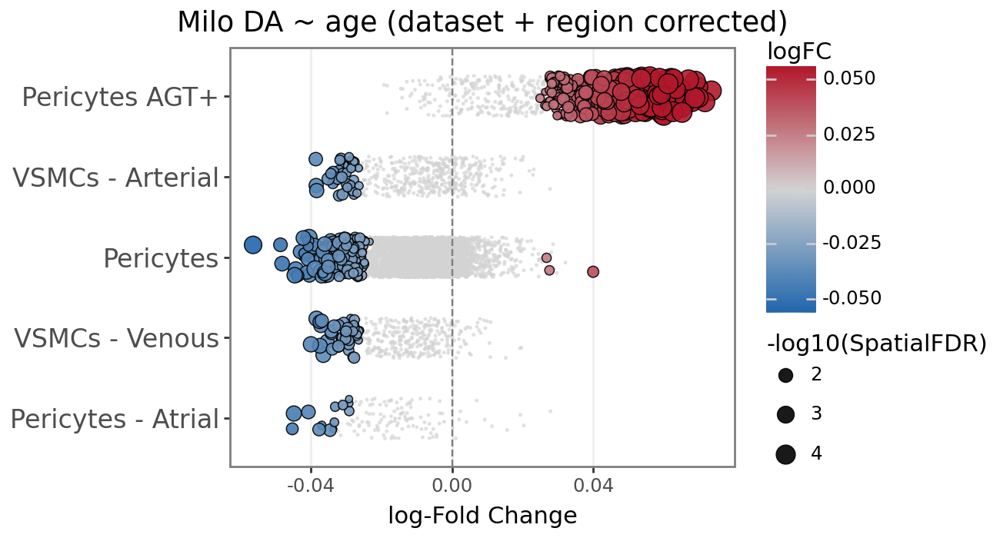

In [62]:
# Usage example
p = milo_plot_beeswarm(
    var_df=mdata["milo"].var,
    title="Milo DA ~ age (dataset + region corrected)",
    fill_legend="logFC",
    size_legend="-log10(SpatialFDR)",
    sig_threshold=0.1,
    figure_size= (,3.5)
)
p

In [63]:
pd.crosstab(adata.obs['Final Level 4_harmonized'], adata.obs['age_continuous'])

age_continuous,10,35,45,55,65,75,85
Final Level 4_harmonized,,,,,,,
Pericytes,1787,3899,23604,28192,13245,2939,20
Pericytes AGT+,273,504,3623,3116,3146,1092,0
Pericytes - Atrial,6,0,1250,1573,380,404,0
VSMCs - Arterial,178,525,2762,3309,2085,626,69
VSMCs - Venous,226,529,2424,3213,1511,380,0


In [64]:
pd.crosstab(adata.obs['dataset'], adata.obs['Final Level 4_harmonized'])

Final Level 4_harmonized,Pericytes,Pericytes AGT+,Pericytes - Atrial,VSMCs - Arterial,VSMCs - Venous
dataset,,,,,
Hocker_2021,1374,850,42,465,233
Kanemaru_2023,4091,1416,1111,495,385
Koenig_2022,12106,2538,19,1555,1494
Linna-Kuosmanen_Carebank_2024,275,23,360,422,79
Linna-Kuosmanen_Periheart_2024,210,11,232,453,82
Litviňuková_2020,13395,2124,1770,2025,1065
Reichart_2022,17632,1956,12,1142,1611
Selewa_2023,5256,1077,6,763,580
Sim_2021,599,175,0,40,69


In [65]:
mdata["rna"].obs[["donor_id", "dataset", "age_continuous"]].drop_duplicates().groupby("dataset")["age_continuous"].describe()

/var/tmp/pbs.3364532.pbs-7/ipykernel_30791/2939470779.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,count,mean,std,min,25%,50%,75%,max
dataset,,,,,,,,
Hocker_2021,2.0,55.000000,0.000000,55.0,55.0,55.0,55.0,55.0
Kanemaru_2023,7.0,56.428571,14.638501,45.0,45.0,45.0,70.0,75.0
Koenig_2022,22.0,50.681818,20.312760,10.0,45.0,60.0,65.0,75.0
Linna-Kuosmanen_Carebank_2024,28.0,64.285714,11.198072,45.0,55.0,65.0,75.0,85.0
Linna-Kuosmanen_Periheart_2024,29.0,68.103448,9.674506,45.0,65.0,65.0,75.0,85.0
Litviňuková_2020,14.0,58.571429,8.418974,45.0,55.0,55.0,65.0,75.0
Reichart_2022,16.0,57.500000,10.000000,45.0,52.5,55.0,65.0,75.0
Selewa_2023,3.0,51.666667,5.773503,45.0,50.0,55.0,55.0,55.0
Sim_2021,3.0,41.666667,5.773503,35.0,40.0,45.0,45.0,45.0


import matplotlib.pyplot as plt

df = mdata["rna"].obs[["donor_id", "dataset", "age_continuous"]].drop_duplicates()
df.boxplot(column="age_continuous", by="dataset", rot=90)
plt.suptitle("")
plt.title("Age distribution by dataset")
plt.ylabel("Age")
plt.show()

In [91]:
#p.save("figures/milo_beeswarm_valveFB.pdf")

In [92]:
#mdata.write("./adata/mdata_milo_hhca_ec_age.h5mu")

# DEG for sig cell state

In [93]:
#import mudata as mu
#mdata = mu.read("./adata/mdata_milo_hhca_ec_age.h5mu")

In [66]:
rna = mdata["rna"]
rna.var_names = rna.var.index.copy()
rna.var_names_make_unique()

In [67]:
rna.var

,feature_types,gene_ids,genome,hb,highly_variable,highly_variable-batch_key=donor_id-n_top_genes=2000,integration_features,mito,n_cells,n_counts,ribo
MIR1302-2HG,Gene Expression,ENSG00000243485,NA,False,False,False,False,False,197,200.0,False
FAM138A,Gene Expression,ENSG00000237613,NA,False,False,False,False,False,5,5.0,False
OR4F5,Gene Expression,ENSG00000186092,NA,False,False,False,False,False,21,21.0,False
AL627309.1,Gene Expression,ENSG00000238009,NA,False,False,False,False,False,28739,30005.0,False
AL627309.3,Gene Expression,ENSG00000239945,NA,False,False,False,False,False,0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,Gene Expression,ENSG00000277836,NA,False,False,False,False,False,0,0.0,False
AC023491.2,Gene Expression,ENSG00000278633,NA,False,False,False,False,False,194,195.0,False
AC007325.1,Gene Expression,ENSG00000276017,NA,False,False,False,False,False,712,718.0,False
AC007325.4,Gene Expression,ENSG00000278817,NA,False,False,False,False,False,14879,15490.0,False


In [68]:
from scipy import sparse
import pandas as pd
import numpy as np

milo = mdata["milo"]

X = rna.X
N = rna.obsm["nhoods"]

# nhood pseudobulk
pseudo = N.T @ X

# COO → CSR
pseudo = pseudo.tocsr()

pseudo_df = pd.DataFrame(
    pseudo.toarray(),
    index=milo.var.index,
    columns=rna.var_names
)

In [69]:
pseudo_df

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
0,0.0,0.000000,0.0,1.218152,0.0,0.0,1.522248,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.630982,0.0,0.0,0.000000,0.564122,0.480518,0.000000
1,0.0,0.770313,0.0,3.984799,0.0,0.0,1.941692,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.606950,0.000000,0.000000
2,0.0,0.000000,0.0,3.956598,0.0,0.0,7.650508,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,1.258842,0.000000
3,0.0,0.000000,0.0,0.594323,0.0,0.0,5.249140,0.0,1.174739,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.979466,0.000000
4,0.0,0.000000,0.0,1.563623,0.0,0.0,1.099756,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.527579,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5535,0.0,0.000000,0.0,2.331919,0.0,0.0,2.992637,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,1.622562,0.991379
5536,0.0,0.000000,0.0,0.000000,0.0,0.0,1.659905,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.637175,0.0,0.0,0.000000,0.436622,1.270874,0.239353
5537,0.0,0.000000,0.0,5.646318,0.0,0.0,7.834770,0.0,0.641205,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.954193,0.000000,2.459877,0.849346
5538,0.0,0.000000,0.0,0.691364,0.0,0.0,1.175834,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.650730,0.000000


In [70]:
milo.var

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,adjust.method,comparison,test,SpatialFDR,Nhood_size,nhood_annotation,nhood_annotation_frac
0,ERS5009240-TCCCAGTCACGCGCAT,2.227237,-0.013056,9.372602,1.563151,0.211483,0.488460,BH,age_continuous,glm,0.491673,634.0,Pericytes,0.946372
1,ERS5009240-CATGCCTAGATCACTC,2.030463,-0.030494,9.500703,7.915015,0.004992,0.064978,BH,age_continuous,glm,0.066162,783.0,Pericytes,0.968072
2,ERS5009240-GAATAGACAGCGAACA,1.746887,-0.019335,9.742988,3.805166,0.051402,0.242768,BH,age_continuous,glm,0.246812,1097.0,Pericytes,0.993619
3,ERS5009240-CGATGCGCAGACACCC,2.007101,-0.031794,9.397414,10.767909,0.001069,0.023142,BH,age_continuous,glm,0.023226,759.0,Pericytes,0.960474
4,ERS5009240-CTTAGGATCGCTGTCT,2.206290,-0.037222,9.258069,11.257153,0.000825,0.018803,BH,age_continuous,glm,0.018788,559.0,Pericytes,0.982111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5535,HCAHeartST13294678-GCTTAACAGCGCTAAT,1.964975,-0.023819,9.344844,5.094157,0.024245,0.157096,BH,age_continuous,glm,0.160506,523.0,Pericytes,0.969407
5536,HCAHeartST13294678-AAGTTTGTCACGAATC,1.864540,0.026066,9.650242,6.031919,0.014245,0.119890,BH,age_continuous,glm,0.122420,787.0,Pericytes AGT+,0.908513
5537,HCAHeartST13294678-TGACTCCTCTGGTCCT,1.624192,-0.007216,9.723113,0.644404,0.422331,0.679360,BH,age_continuous,glm,0.679475,1261.0,Pericytes,0.983347
5538,HCAHeartST13294678-GGTGTCCAGCATTTCT,1.941544,-0.013725,9.316166,1.887211,0.169843,0.440511,BH,age_continuous,glm,0.444031,505.0,Pericytes,0.948515


# Explore Pericyte_AGT+

In [71]:
target = milo.var["nhood_annotation"] == "Pericytes AGT+"

target_nhood = milo.var.index[target]
pseudo_df_target = pseudo_df[target]

In [72]:
milo.var["nhood_annotation"].head(50)

0            Pericytes
1            Pericytes
2            Pericytes
3            Pericytes
4            Pericytes
5            Pericytes
6            Pericytes
7            Pericytes
8            Pericytes
9            Pericytes
10           Pericytes
11           Pericytes
12           Pericytes
13    VSMCs - Arterial
14           Pericytes
15           Pericytes
16           Pericytes
17           Pericytes
18           Pericytes
19           Pericytes
20    VSMCs - Arterial
21           Pericytes
22           Pericytes
23           Pericytes
24           Pericytes
25           Pericytes
26           Pericytes
27           Pericytes
28           Pericytes
29    VSMCs - Arterial
30           Pericytes
31           Pericytes
32    VSMCs - Arterial
33           Pericytes
34           Pericytes
35           Pericytes
36           Pericytes
37           Pericytes
38           Pericytes
39           Pericytes
40           Pericytes
41           Pericytes
42           Pericytes
43    VSMCs

In [73]:
target_nhood

Index(['98', '109', '111', '116', '173', '176', '182', '190', '203', '204',
       ...
       '5512', '5515', '5517', '5518', '5522', '5527', '5528', '5529', '5530',
       '5536'],
      dtype='object', length=522)

In [74]:
meta_df = milo.var.loc[
    milo.var["nhood_annotation"] == "Pericytes AGT+",
    ["FDR","logFC"]
].copy()

meta_df["group"] = "nonDA"
meta_df.loc[(meta_df["logFC"] > 0), "group"] = "DA" # & (meta_df["FDR"] < 0.1)

In [75]:
meta_df

,FDR,logFC,group
98,0.244519,0.024856,DA
109,0.025576,0.037416,DA
111,0.015550,0.037409,DA
116,0.686701,-0.008074,nonDA
173,0.177905,0.023434,DA
...,...,...,...
5527,0.746260,0.007801,DA
5528,0.177905,0.023068,DA
5529,0.614774,0.009400,DA
5530,0.324577,0.018019,DA


In [76]:
pseudo_df_target

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
98,0.0,0.0,0.0,1.534702,0.0,0.000000,0.596063,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
109,0.0,0.0,0.0,0.949176,0.0,0.000000,0.266315,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.262336,0.000000
111,0.0,0.0,0.0,0.624326,0.0,0.000000,0.756106,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.996129,0.000000
116,0.0,0.0,0.0,1.421458,0.0,0.449706,2.169505,0.0,0.158844,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.239353
173,0.0,0.0,0.0,0.609222,0.0,0.000000,0.527219,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.838541,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5527,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
5528,0.0,0.0,0.0,0.875747,0.0,0.000000,1.001538,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.637175,0.0,0.0,0.0,0.000000,1.677209,0.000000
5529,0.0,0.0,0.0,2.312400,0.0,0.000000,1.093294,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.436622,2.522290,0.000000
5530,0.0,0.0,0.0,2.091333,0.0,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.561271,0.000000


In [77]:
pseudo_sub = pseudo_df_target.loc[meta_df.index]
counts_df = pseudo_sub.T

# DE analysis  using EdgeR

In [78]:
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri, Formula
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter

edgeR = importr("edgeR")
base = importr("base")
stats = importr("stats")

with localconverter(default_converter + pandas2ri.converter):
    r_counts = ro.conversion.py2rpy(counts_df)
    r_meta = ro.conversion.py2rpy(meta_df)

ro.globalenv["counts"] = r_counts
ro.globalenv["meta"] = r_meta

ro.r("""
library(edgeR)

y <- DGEList(counts=counts)

keep <- filterByExpr(y, group=meta$group)
y <- y[keep, , keep.lib.sizes=FALSE]

y <- calcNormFactors(y)

meta$group <- factor(meta$group, levels=c("nonDA","DA"))

design <- model.matrix(~ group, data=meta)

y <- estimateDisp(y, design)
fit <- glmQLFit(y, design)

qlf <- glmQLFTest(fit, coef="groupDA")

res <- topTags(qlf, n=Inf)$table
""")

with localconverter(default_converter + pandas2ri.converter):
    res_df = ro.conversion.rpy2py(ro.r("res"))

res_df.head()

R callback write-console: In addition:   
R callback write-console: Warning messages:
  
R callback write-console: 1:   
R callback write-console: In max(abs(logR)) :  
R callback write-console:  no non-missing arguments to max; returning -Inf
  
R callback write-console: 2:   
R callback write-console: In max(abs(logR)) :  
R callback write-console:  no non-missing arguments to max; returning -Inf
  


,logFC,logCPM,F,PValue,FDR
IFITM3,1.199542,10.219939,211.815920,1.453885e-40,1.564381e-36
AGT,1.005403,10.282822,191.663802,2.190813e-37,1.178657e-33
HLA-B,1.223414,8.986477,188.348260,7.452656e-37,2.673019e-33
DAD1,1.375630,7.603736,185.595387,2.071768e-36,5.154832e-33
CST3,1.160197,10.415853,184.725311,2.857039e-36,5.154832e-33


In [79]:
res_df.to_csv("pericyte_AGT+_degs.csv")

# downstream analysis

In [9]:
res_df = pd.read_csv("pericyte_AGT+_degs.csv",index_col=0)

In [10]:
res_df

,logFC,logCPM,F,PValue,FDR
IFITM3,1.199542,10.219939,2.118159e+02,1.453885e-40,1.564381e-36
AGT,1.005403,10.282822,1.916638e+02,2.190813e-37,1.178657e-33
HLA-B,1.223414,8.986477,1.883483e+02,7.452656e-37,2.673019e-33
DAD1,1.375630,7.603736,1.855954e+02,2.071768e-36,5.154832e-33
CST3,1.160197,10.415853,1.847253e+02,2.857039e-36,5.154832e-33
...,...,...,...,...,...
LRP5,0.000169,5.125888,1.050749e-05,9.974149e-01,9.977858e-01
FKBP11,0.000299,3.919502,6.861781e-06,9.979110e-01,9.981893e-01
ATP2B1,0.000052,5.784071,2.773714e-06,9.986718e-01,9.988575e-01
ZNF682,0.000030,3.983508,1.025816e-06,9.991923e-01,9.992851e-01


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from adjustText import adjust_text
from pathlib import Path

def plot_volcano(
        res_df,
        logfc_col="logFC",
        fdr_col="FDR",
        neglog_col="neglog10FDR",
        title="Volcano plot",
        logfc_cut=0.25,
        fdr_cut=0.05,
        top_fc_n=6,
        top_sig_n=6,
        exclude_prefix=("AC","LINC","RP","MIR"),
        prefix="",
        outdir="volcano_plots",
        save=True,
        highlight_genes=None,
        label_top_genes=True):

    df = res_df.copy()
    highlight_genes = highlight_genes or []

    if neglog_col not in df.columns:
        df[neglog_col] = -np.log10(df[fdr_col] + 1e-300)

    up = (df[logfc_col] >= logfc_cut) & (df[fdr_col] <= fdr_cut)
    down = (df[logfc_col] <= -logfc_cut) & (df[fdr_col] <= fdr_cut)
    nonsig = ~(up | down)

    fig, ax = plt.subplots(figsize=(7, 6))

    ax.scatter(
        df.loc[nonsig, logfc_col],
        df.loc[nonsig, neglog_col],
        s=6,
        color="lightgrey",
        label="non-sig",
        rasterized=True
    )

    ax.scatter(
        df.loc[down, logfc_col],
        df.loc[down, neglog_col],
        s=8,
        color="#2166AC",
        label="Down"
    )

    ax.scatter(
        df.loc[up, logfc_col],
        df.loc[up, neglog_col],
        s=8,
        color="#B2182B",
        label="Up"
    )

    ax.axvline(logfc_cut, linestyle="--", color="grey")
    ax.axvline(-logfc_cut, linestyle="--", color="grey")
    ax.axhline(-np.log10(fdr_cut), linestyle="--", color="grey")

    ax.set_xlabel("log2FC")
    ax.set_ylabel("-log10(FDR)")
    ax.set_title(title)

    texts = []
    labeled_genes = set()

    # -----------------------
    # auto-label top / bottom genes by logFC
    # -----------------------
    if label_top_genes:
        label_df = df.copy()
    
        for p in exclude_prefix:
            label_df = label_df[~label_df.index.str.startswith(p)]
    
        # optional: only label significant genes
        label_df = label_df[label_df[fdr_col] <= fdr_cut]
    
        top_up_fc = (
            label_df
            .sort_values(logfc_col, ascending=False)
            .head(20)
        )
    
        top_down_fc = (
            label_df
            .sort_values(logfc_col, ascending=True)
            .head(20)
        )
    
        label_candidates = list(top_up_fc.index) + list(top_down_fc.index)
    
        unique_labels = []
        for g in label_candidates:
            if g not in labeled_genes:
                unique_labels.append(g)
                labeled_genes.add(g)
    
        for gene in unique_labels:
            row = label_df.loc[gene]
            texts.append(
                ax.text(
                    row[logfc_col],
                    row[neglog_col],
                    gene,
                    fontsize=9
                )
            )

    # -----------------------
    # highlight user-specified genes
    # -----------------------
    present_highlights = [g for g in highlight_genes if g in df.index]
    missing_highlights = [g for g in highlight_genes if g not in df.index]

    highlight_df = df.loc[present_highlights]

    if len(highlight_df) > 0:
        ax.scatter(
            highlight_df[logfc_col],
            highlight_df[neglog_col],
            s=28,
            color="black",
            zorder=10,
            label="Highlighted genes"
        )

        for gene, row in highlight_df.iterrows():
            texts.append(
                ax.text(
                    row[logfc_col],
                    row[neglog_col],
                    gene,
                    fontsize=10,
                    fontweight="bold",
                    color="black"
                )
            )

    if texts:
        adjust_text(
            texts,
            arrowprops=dict(arrowstyle="-", color="grey", lw=0.6)
        )

    if missing_highlights:
        print("Not found in index:", ", ".join(missing_highlights))

    ax.legend(frameon=False)
    plt.tight_layout()

    if save:
        outdir = Path(outdir)
        outdir.mkdir(exist_ok=True)
        fname = f"{prefix}volcano.pdf"
        fpath = outdir / fname
        plt.savefig(fpath, bbox_inches="tight")
        print(f"Saved: {fpath}")

    plt.show()

    low_color: str = "#2166AC",
    mid_color: str = "lightgrey",
    high_color: str = "#B2182B",

Saved: volcano_plots/volcano.pdf


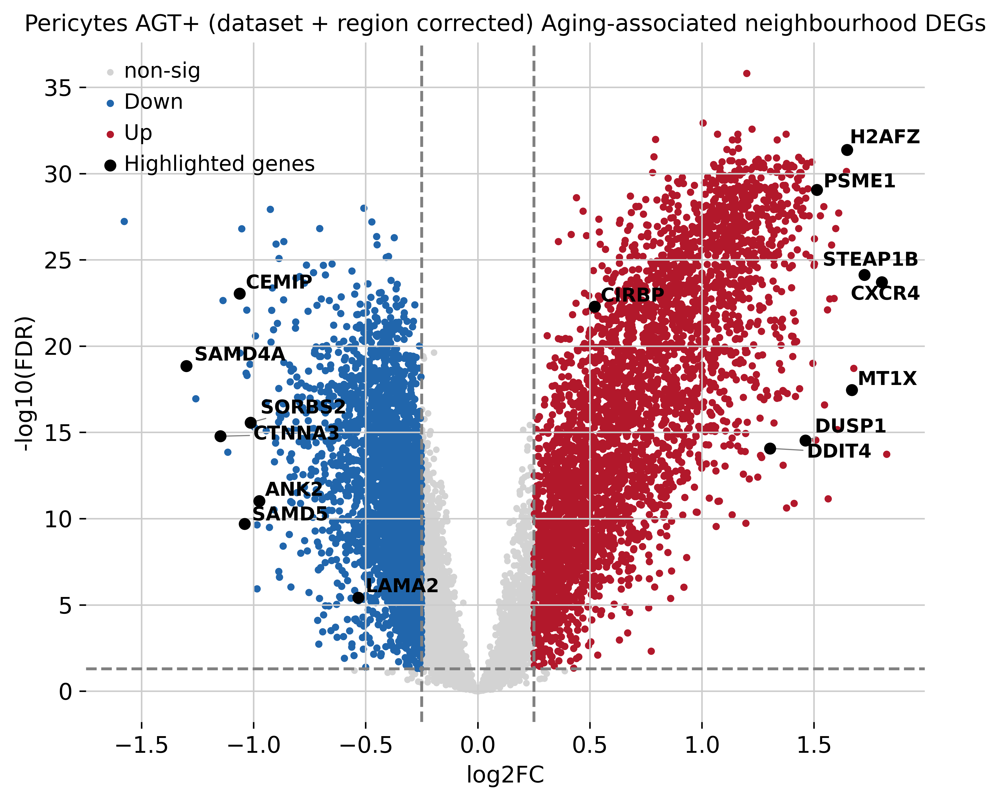

In [17]:
plot_volcano(
    res_df,
    title="Pericytes AGT+ (dataset + region corrected) Aging-associated neighbourhood DEGs",
    logfc_cut=0.25,
    fdr_cut=0.05,
    exclude_prefix=("AC", "LINC", "MIR", "AL"),
    highlight_genes=["CXCR4","DDIT4","DUSP1","CIRBP","CTNNA3","CEMIP","LAMA2","SAMD4A","SORBS2","ANK2","SAMD5","H2AFZ","MT1X","PSME1","STEAP1B"],
    label_top_genes=False
)